## Machine Downtime Prediction

The aim of the project is to predict the machine is failure or not with the help of some features and variables.

Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('Machine Downtime.csv')

In [3]:
df

,Date,Machine_ID,Assembly_Line_No,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Coolant_Temperature,Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime
0,31-12-2021,Makino-L1-Unit1-2013,Shopfloor-L1,71.040000,6.933725,6.284965,25.6,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58,Machine_Failure
1,31-12-2021,Makino-L1-Unit1-2013,Shopfloor-L1,125.330000,4.936892,6.196733,35.3,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68,Machine_Failure
2,31-12-2021,Makino-L3-Unit1-2015,Shopfloor-L3,71.120000,6.839413,6.655448,13.1,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55,Machine_Failure
3,31-05-2022,Makino-L2-Unit1-2015,Shopfloor-L2,139.340000,4.574382,6.560394,24.4,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55,Machine_Failure
4,31-03-2022,Makino-L1-Unit1-2013,Shopfloor-L1,60.510000,6.893182,6.141238,4.1,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55,Machine_Failure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,01-02-2022,Makino-L1-Unit1-2013,Shopfloor-L1,112.715506,5.220885,6.196610,22.3,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72,No_Machine_Failure
2496,01-02-2022,Makino-L1-Unit1-2013,Shopfloor-L1,103.086653,5.211886,7.074653,11.9,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94,No_Machine_Failure
2497,01-02-2022,Makino-L2-Unit1-2015,Shopfloor-L2,118.643165,5.212991,6.530049,4.5,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,NaN,No_Machine_Failure
2498,01-02-2022,Makino-L3-Unit1-2015,Shopfloor-L3,145.855859,5.207777,6.402655,12.2,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79,No_Machine_Failure


In [4]:
display(df.head())
display(df.tail())

,Date,Machine_ID,Assembly_Line_No,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Coolant_Temperature,Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime
0,31-12-2021,Makino-L1-Unit1-2013,Shopfloor-L1,71.04,6.933725,6.284965,25.6,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58,Machine_Failure
1,31-12-2021,Makino-L1-Unit1-2013,Shopfloor-L1,125.33,4.936892,6.196733,35.3,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68,Machine_Failure
2,31-12-2021,Makino-L3-Unit1-2015,Shopfloor-L3,71.12,6.839413,6.655448,13.1,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55,Machine_Failure
3,31-05-2022,Makino-L2-Unit1-2015,Shopfloor-L2,139.34,4.574382,6.560394,24.4,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55,Machine_Failure
4,31-03-2022,Makino-L1-Unit1-2013,Shopfloor-L1,60.51,6.893182,6.141238,4.1,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55,Machine_Failure


,Date,Machine_ID,Assembly_Line_No,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Coolant_Temperature,Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime
2495,01-02-2022,Makino-L1-Unit1-2013,Shopfloor-L1,112.715506,5.220885,6.196610,22.3,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72,No_Machine_Failure
2496,01-02-2022,Makino-L1-Unit1-2013,Shopfloor-L1,103.086653,5.211886,7.074653,11.9,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94,No_Machine_Failure
2497,01-02-2022,Makino-L2-Unit1-2015,Shopfloor-L2,118.643165,5.212991,6.530049,4.5,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,NaN,No_Machine_Failure
2498,01-02-2022,Makino-L3-Unit1-2015,Shopfloor-L3,145.855859,5.207777,6.402655,12.2,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79,No_Machine_Failure
2499,01-02-2022,Makino-L2-Unit1-2015,Shopfloor-L2,96.690000,5.936610,7.109355,29.8,53.2,36.2,0.840,31.580,23576.0,385.0,24.409551,3.55,Machine_Failure


In [5]:
df.shape

(2500, 16)

In [6]:
df.columns

Index(['Date', 'Machine_ID', 'Assembly_Line_No', 'Hydraulic_Pressure(bar)',
       'Coolant_Pressure(bar)', 'Air_System_Pressure(bar)',
       'Coolant_Temperature', 'Hydraulic_Oil_Temperature(°C)',
       'Spindle_Bearing_Temperature(°C)', 'Spindle_Vibration(µm)',
       'Tool_Vibration(µm)', 'Spindle_Speed(RPM)', 'Voltage(volts)',
       'Torque(Nm)', 'Cutting(kN)', 'Downtime'],
      dtype='object')

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Hydraulic_Pressure(bar),2490.0,101.409084,30.289301,-14.326454,76.355000,96.763486,126.415727,191.000000
Coolant_Pressure(bar),2481.0,4.947058,0.997357,0.325000,4.462464,4.939960,5.518401,11.350000
Air_System_Pressure(bar),2483.0,6.499275,0.407279,5.063480,6.217987,6.505191,6.780550,7.973992
Coolant_Temperature,2488.0,18.559887,8.554480,4.100000,10.400000,21.200000,25.600000,98.200000
Hydraulic_Oil_Temperature(°C),2484.0,47.618317,3.768674,35.200000,45.100000,47.700000,50.100000,61.400000
Spindle_Bearing_Temperature(°C),2493.0,35.063698,3.764823,22.600000,32.500000,35.100000,37.600000,49.500000
Spindle_Vibration(µm),2489.0,1.009334,0.342898,-0.461000,0.777000,1.008000,1.236000,2.000000
Tool_Vibration(µm),2489.0,25.411975,6.437142,2.161000,21.089000,25.455000,29.790000,45.726000
Spindle_Speed(RPM),2494.0,20274.792302,3852.660056,0.000000,17919.000000,20137.500000,22501.750000,27957.000000
Voltage(volts),2494.0,348.996792,45.376024,202.000000,319.000000,349.000000,380.000000,479.000000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 16 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Date                             2500 non-null   object 
 1   Machine_ID                       2500 non-null   object 
 2   Assembly_Line_No                 2500 non-null   object 
 3   Hydraulic_Pressure(bar)          2490 non-null   float64
 4   Coolant_Pressure(bar)            2481 non-null   float64
 5   Air_System_Pressure(bar)         2483 non-null   float64
 6   Coolant_Temperature              2488 non-null   float64
 7   Hydraulic_Oil_Temperature(°C)    2484 non-null   float64
 8   Spindle_Bearing_Temperature(°C)  2493 non-null   float64
 9   Spindle_Vibration(µm)            2489 non-null   float64
 10  Tool_Vibration(µm)               2489 non-null   float64
 11  Spindle_Speed(RPM)               2494 non-null   float64
 12  Voltage(volts)      

In [9]:
df.dtypes

Date                                object
Machine_ID                          object
Assembly_Line_No                    object
Hydraulic_Pressure(bar)            float64
Coolant_Pressure(bar)              float64
Air_System_Pressure(bar)           float64
Coolant_Temperature                float64
Hydraulic_Oil_Temperature(°C)      float64
Spindle_Bearing_Temperature(°C)    float64
Spindle_Vibration(µm)              float64
Tool_Vibration(µm)                 float64
Spindle_Speed(RPM)                 float64
Voltage(volts)                     float64
Torque(Nm)                         float64
Cutting(kN)                        float64
Downtime                            object
dtype: object

In [10]:
df.nunique()

Date                                164
Machine_ID                            3
Assembly_Line_No                      3
Hydraulic_Pressure(bar)            1977
Coolant_Pressure(bar)              1628
Air_System_Pressure(bar)           2472
Coolant_Temperature                 275
Hydraulic_Oil_Temperature(°C)       209
Spindle_Bearing_Temperature(°C)     204
Spindle_Vibration(µm)              1144
Tool_Vibration(µm)                 2350
Spindle_Speed(RPM)                 1180
Voltage(volts)                      238
Torque(Nm)                         1327
Cutting(kN)                         170
Downtime                              2
dtype: int64

In [11]:
df.value_counts()

Date        Machine_ID            Assembly_Line_No  Hydraulic_Pressure(bar)  Coolant_Pressure(bar)  Air_System_Pressure(bar)  Coolant_Temperature  Hydraulic_Oil_Temperature(°C)  Spindle_Bearing_Temperature(°C)  Spindle_Vibration(µm)  Tool_Vibration(µm)  Spindle_Speed(RPM)  Voltage(volts)  Torque(Nm)  Cutting(kN)  Downtime          
01-02-2022  Makino-L1-Unit1-2013  Shopfloor-L1      55.540000                4.841605               6.852283                  26.4                 42.9                           36.2                             1.436                  24.819              26526.0             348.0           15.119739   2.53         Machine_Failure       1
20-03-2022  Makino-L3-Unit1-2015  Shopfloor-L3      81.240000                6.863944               5.456959                  21.1                 51.3                           32.1                             0.869                  25.332              20504.0             202.0           28.235273   3.59         Machine_Fail

In [12]:
df.duplicated().any()

False

In [13]:
df.duplicated().sum()

0

In [14]:
df.isna().sum()

Date                                0
Machine_ID                          0
Assembly_Line_No                    0
Hydraulic_Pressure(bar)            10
Coolant_Pressure(bar)              19
Air_System_Pressure(bar)           17
Coolant_Temperature                12
Hydraulic_Oil_Temperature(°C)      16
Spindle_Bearing_Temperature(°C)     7
Spindle_Vibration(µm)              11
Tool_Vibration(µm)                 11
Spindle_Speed(RPM)                  6
Voltage(volts)                      6
Torque(Nm)                         21
Cutting(kN)                         7
Downtime                            0
dtype: int64

In [15]:
df.kurtosis()

C:\Users\chakr\AppData\Local\Temp\ipykernel_8180\615572439.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.kurtosis()


Hydraulic_Pressure(bar)           -0.920292
Coolant_Pressure(bar)              1.169455
Air_System_Pressure(bar)          -0.001578
Coolant_Temperature                1.564639
Hydraulic_Oil_Temperature(°C)      0.038164
Spindle_Bearing_Temperature(°C)   -0.043862
Spindle_Vibration(µm)             -0.018718
Tool_Vibration(µm)                 0.006451
Spindle_Speed(RPM)                 1.344769
Voltage(volts)                    -0.090328
Torque(Nm)                        -0.465628
Cutting(kN)                       -1.087171
dtype: float64

In [16]:
df.skew()

C:\Users\chakr\AppData\Local\Temp\ipykernel_8180\1665899112.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.skew()


Hydraulic_Pressure(bar)            0.197076
Coolant_Pressure(bar)              0.147081
Air_System_Pressure(bar)          -0.052899
Coolant_Temperature                0.108301
Hydraulic_Oil_Temperature(°C)     -0.002291
Spindle_Bearing_Temperature(°C)   -0.035942
Spindle_Vibration(µm)              0.001532
Tool_Vibration(µm)                -0.061005
Spindle_Speed(RPM)                -0.172475
Voltage(volts)                    -0.028658
Torque(Nm)                         0.030578
Cutting(kN)                        0.113963
dtype: float64

In [17]:
df['Downtime'].value_counts()

Machine_Failure       1265
No_Machine_Failure    1235
Name: Downtime, dtype: int64

In [18]:
df['Downtime'].replace(['Machine_Failure', 'No_Machine_Failure'], [1, 0], inplace = True)

In [19]:
df

,Date,Machine_ID,Assembly_Line_No,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Coolant_Temperature,Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime
0,31-12-2021,Makino-L1-Unit1-2013,Shopfloor-L1,71.040000,6.933725,6.284965,25.6,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58,1
1,31-12-2021,Makino-L1-Unit1-2013,Shopfloor-L1,125.330000,4.936892,6.196733,35.3,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68,1
2,31-12-2021,Makino-L3-Unit1-2015,Shopfloor-L3,71.120000,6.839413,6.655448,13.1,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55,1
3,31-05-2022,Makino-L2-Unit1-2015,Shopfloor-L2,139.340000,4.574382,6.560394,24.4,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55,1
4,31-03-2022,Makino-L1-Unit1-2013,Shopfloor-L1,60.510000,6.893182,6.141238,4.1,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,01-02-2022,Makino-L1-Unit1-2013,Shopfloor-L1,112.715506,5.220885,6.196610,22.3,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72,0
2496,01-02-2022,Makino-L1-Unit1-2013,Shopfloor-L1,103.086653,5.211886,7.074653,11.9,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94,0
2497,01-02-2022,Makino-L2-Unit1-2015,Shopfloor-L2,118.643165,5.212991,6.530049,4.5,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,NaN,0
2498,01-02-2022,Makino-L3-Unit1-2015,Shopfloor-L3,145.855859,5.207777,6.402655,12.2,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79,0


In [20]:
cat = df. select_dtypes(include=['object'])

In [21]:
df['Downtime'].value_counts()

1    1265
0    1235
Name: Downtime, dtype: int64

In [22]:
df.dtypes

Date                                object
Machine_ID                          object
Assembly_Line_No                    object
Hydraulic_Pressure(bar)            float64
Coolant_Pressure(bar)              float64
Air_System_Pressure(bar)           float64
Coolant_Temperature                float64
Hydraulic_Oil_Temperature(°C)      float64
Spindle_Bearing_Temperature(°C)    float64
Spindle_Vibration(µm)              float64
Tool_Vibration(µm)                 float64
Spindle_Speed(RPM)                 float64
Voltage(volts)                     float64
Torque(Nm)                         float64
Cutting(kN)                        float64
Downtime                             int64
dtype: object

In [23]:
cat

,Date,Machine_ID,Assembly_Line_No
0,31-12-2021,Makino-L1-Unit1-2013,Shopfloor-L1
1,31-12-2021,Makino-L1-Unit1-2013,Shopfloor-L1
2,31-12-2021,Makino-L3-Unit1-2015,Shopfloor-L3
3,31-05-2022,Makino-L2-Unit1-2015,Shopfloor-L2
4,31-03-2022,Makino-L1-Unit1-2013,Shopfloor-L1
...,...,...,...
2495,01-02-2022,Makino-L1-Unit1-2013,Shopfloor-L1
2496,01-02-2022,Makino-L1-Unit1-2013,Shopfloor-L1
2497,01-02-2022,Makino-L2-Unit1-2015,Shopfloor-L2
2498,01-02-2022,Makino-L3-Unit1-2015,Shopfloor-L3


To drop unnecessary columns

In [24]:
df.drop(['Date'], axis = 1, inplace = True)

In [25]:
df

,Machine_ID,Assembly_Line_No,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Coolant_Temperature,Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime
0,Makino-L1-Unit1-2013,Shopfloor-L1,71.040000,6.933725,6.284965,25.6,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58,1
1,Makino-L1-Unit1-2013,Shopfloor-L1,125.330000,4.936892,6.196733,35.3,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68,1
2,Makino-L3-Unit1-2015,Shopfloor-L3,71.120000,6.839413,6.655448,13.1,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55,1
3,Makino-L2-Unit1-2015,Shopfloor-L2,139.340000,4.574382,6.560394,24.4,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55,1
4,Makino-L1-Unit1-2013,Shopfloor-L1,60.510000,6.893182,6.141238,4.1,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,Makino-L1-Unit1-2013,Shopfloor-L1,112.715506,5.220885,6.196610,22.3,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72,0
2496,Makino-L1-Unit1-2013,Shopfloor-L1,103.086653,5.211886,7.074653,11.9,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94,0
2497,Makino-L2-Unit1-2015,Shopfloor-L2,118.643165,5.212991,6.530049,4.5,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,NaN,0
2498,Makino-L3-Unit1-2015,Shopfloor-L3,145.855859,5.207777,6.402655,12.2,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79,0


In [26]:
df['Machine_ID'].value_counts()

Makino-L1-Unit1-2013    874
Makino-L3-Unit1-2015    818
Makino-L2-Unit1-2015    808
Name: Machine_ID, dtype: int64

### Exploratory Data Analysis

In the exploratory data analysis, I will be visualizing the data to get a better understanding of the data and to see if there are any trends or patterns in the data. First I will begin with looking at the distribution of the data and then I will look at the relationship between the independent variables and the target variable.

In [27]:
pip install missingno

<function matplotlib.pyplot.show(close=None, block=None)>

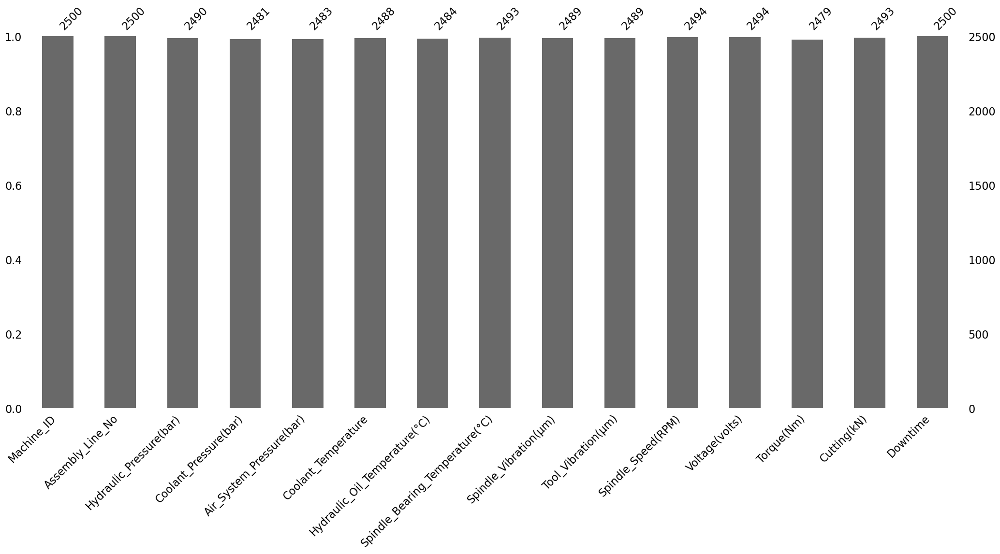

In [28]:
import missingno as msno

msno.bar(df)
plt.show

##### The above graph shows how many missing values are there in our given data.

In [29]:
num = df.select_dtypes(include=['float64'])

In [30]:
num

,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Coolant_Temperature,Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN)
0,71.040000,6.933725,6.284965,25.6,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58
1,125.330000,4.936892,6.196733,35.3,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68
2,71.120000,6.839413,6.655448,13.1,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55
3,139.340000,4.574382,6.560394,24.4,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55
4,60.510000,6.893182,6.141238,4.1,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55
...,...,...,...,...,...,...,...,...,...,...,...,...
2495,112.715506,5.220885,6.196610,22.3,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72
2496,103.086653,5.211886,7.074653,11.9,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94
2497,118.643165,5.212991,6.530049,4.5,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,NaN
2498,145.855859,5.207777,6.402655,12.2,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79


<AxesSubplot:xlabel='Downtime', ylabel='count'>

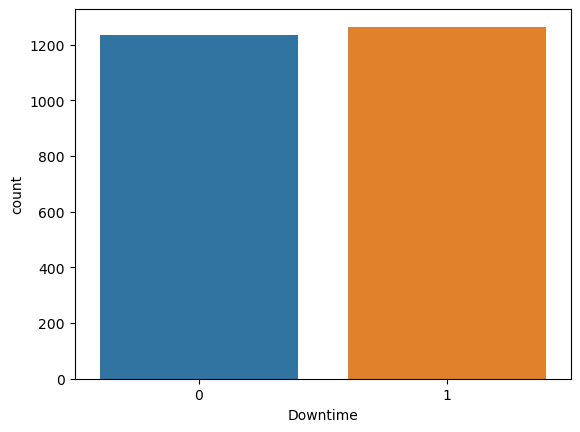

In [31]:
sns.countplot(x = df['Downtime'])

## Insight

#### if both machine Failure and not machine falures are same in given records.

<AxesSubplot:xlabel='Assembly_Line_No', ylabel='count'>

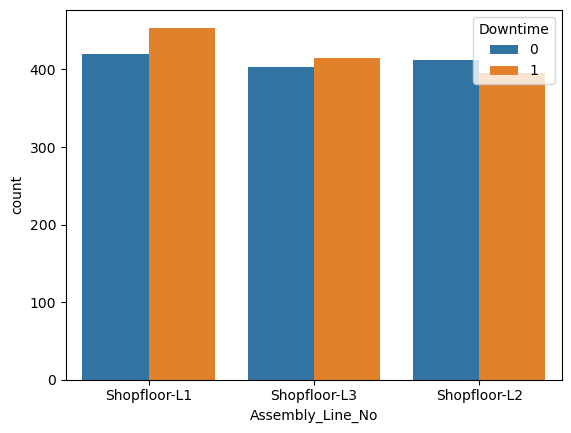

In [32]:
sns.countplot(x = df['Assembly_Line_No'], hue = df['Downtime'])

<AxesSubplot:xlabel='Assembly_Line_No', ylabel='count'>

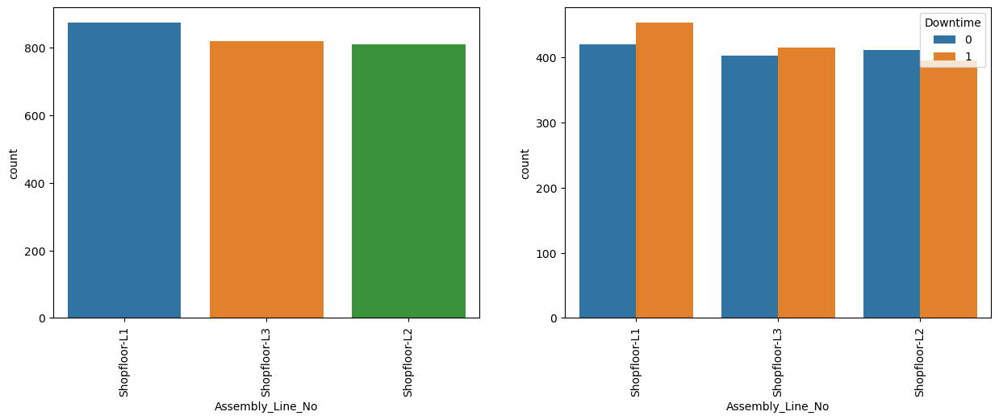

In [33]:
plt.figure(figsize = (15,5))
plt.subplot(1,2,1)
plt.xticks(rotation=90)
sns.countplot(x = df['Assembly_Line_No'])
plt.subplot(1,2,2)
plt.xticks(rotation=90)
sns.countplot(x = df['Assembly_Line_No'], hue = 'Downtime', data = df)

### insight

#### if above graph shows 'shopfloor-L1' type of machine no is mostly used. when compare to others types.

<AxesSubplot:xlabel='Machine_ID', ylabel='count'>

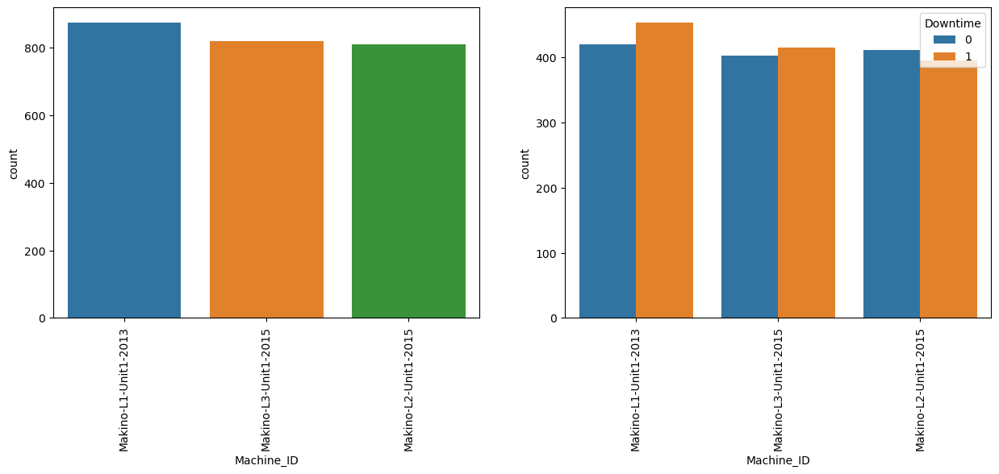

In [34]:
plt.figure(figsize = (15,5))
plt.subplot(1,2,1)
plt.xticks(rotation=90)
sns.countplot(x = df['Machine_ID'])
plt.subplot(1,2,2)
plt.xticks(rotation=90)
sns.countplot(x = df['Machine_ID'], hue = 'Downtime', data = df)

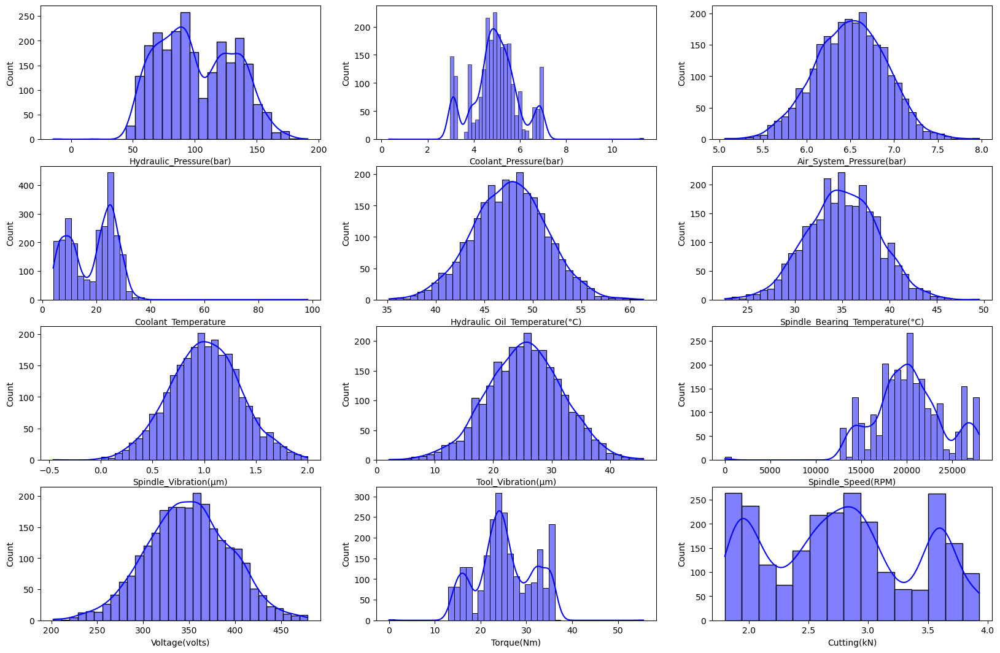

In [35]:
plt.figure(figsize=(20,30))
for i in range(len(num.columns)):
  plt.subplot(9, 3, i+1)
  sns.histplot(x = num.columns[i], data = df, kde = True, color = 'blue')
  plt.xlabel(num.columns[i])
plt.show()

The above graphs shows how data is distributed to show them.

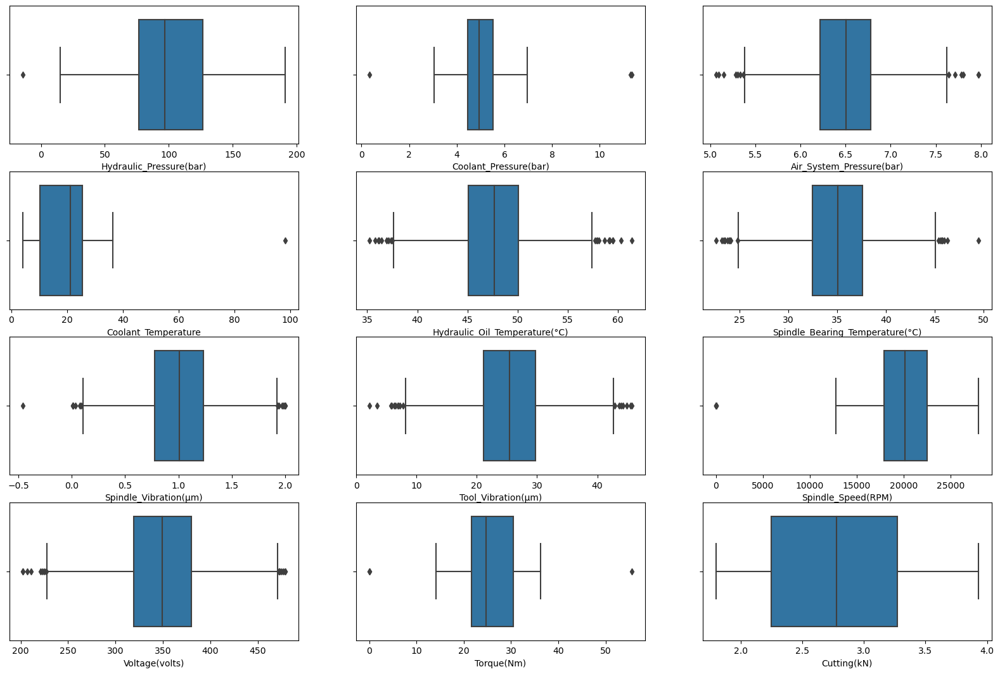

In [36]:
plt.figure(figsize=(20,30))
for i in range(len(num.columns)):
  plt.subplot(9, 3, i+1)
  sns.boxplot(x = num.columns[i], data = df)
  plt.xlabel(num.columns[i])
plt.show()

#### The above plots shows outliers are presents in our data

To find correlation

In [37]:
df.corr()

,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Coolant_Temperature,Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime
Hydraulic_Pressure(bar),1.000000,-0.074700,-0.029783,-0.111344,0.008647,0.022488,-0.006327,0.020943,-0.120393,-0.004016,0.162734,-0.222217,-0.558218
Coolant_Pressure(bar),-0.074700,1.000000,-0.028886,0.008372,0.001270,-0.012733,0.005644,-0.005033,0.089118,0.031202,-0.103770,0.169249,0.171678
Air_System_Pressure(bar),-0.029783,-0.028886,1.000000,0.048932,-0.025910,0.009864,0.008825,0.045552,-0.001635,0.006661,0.036862,-0.000819,0.009213
Coolant_Temperature,-0.111344,0.008372,0.048932,1.000000,0.004399,-0.017283,0.012228,0.006607,0.073002,0.011413,-0.070775,0.097297,0.169235
Hydraulic_Oil_Temperature(°C),0.008647,0.001270,-0.025910,0.004399,1.000000,0.040966,-0.006140,-0.015570,0.004959,0.026838,-0.006733,-0.019863,-0.012647
Spindle_Bearing_Temperature(°C),0.022488,-0.012733,0.009864,-0.017283,0.040966,1.000000,-0.035446,-0.007210,0.030357,0.015031,-0.003264,0.003097,-0.019472
Spindle_Vibration(µm),-0.006327,0.005644,0.008825,0.012228,-0.006140,-0.035446,1.000000,-0.019396,0.018725,0.005367,0.028124,-0.018774,-0.016665
Tool_Vibration(µm),0.020943,-0.005033,0.045552,0.006607,-0.015570,-0.007210,-0.019396,1.000000,0.008364,0.021920,-0.019112,-0.038619,-0.005889
Spindle_Speed(RPM),-0.120393,0.089118,-0.001635,0.073002,0.004959,0.030357,0.018725,0.008364,1.000000,-0.018401,-0.194590,0.230839,0.275127
Voltage(volts),-0.004016,0.031202,0.006661,0.011413,0.026838,0.015031,0.005367,0.021920,-0.018401,1.000000,0.006885,-0.043338,0.005853


### Correlation Matrix Heatmap

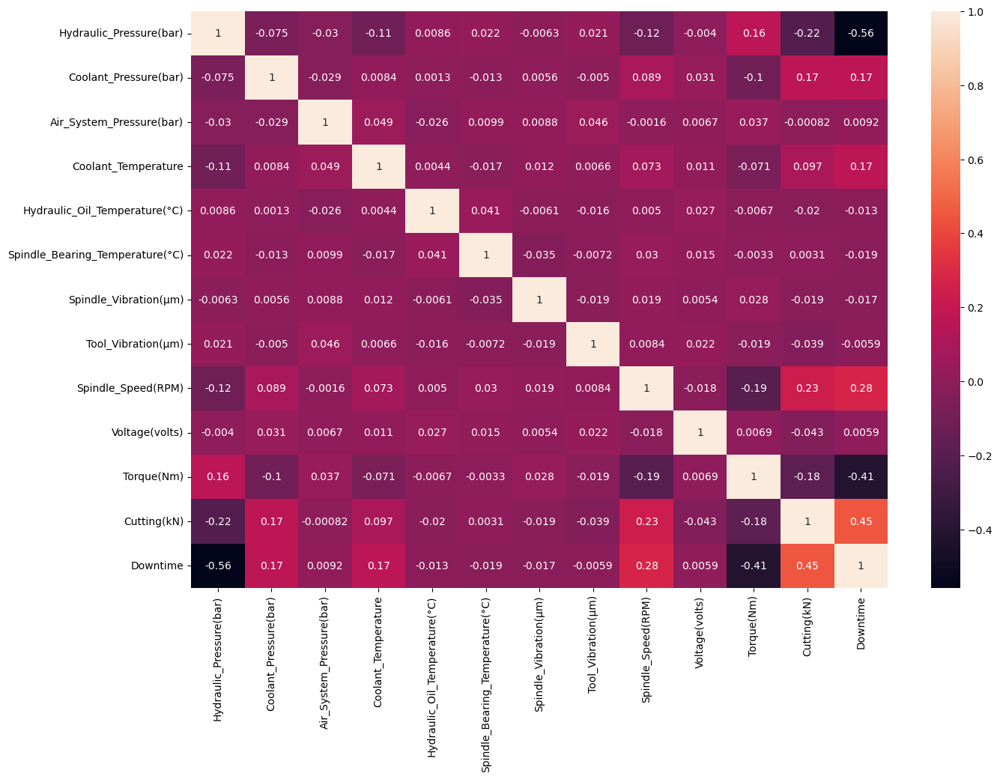

In [38]:
plt.figure(figsize = (15,10))
sns.heatmap(data = df.corr(), annot = True)
plt.show()

In [39]:
from sklearn.impute import SimpleImputer

In [40]:
def imputation(num):
  for i in num:
    imputer = SimpleImputer(strategy = 'median', missing_values=np.nan)
    df[i] = imputer.fit_transform(df[i].values.reshape(-1,1))
    #data1[i] = pd.DataFrame(imputer.fit_transform(data1[i]))
imputation(num)

In [41]:
df.isna().sum()

Machine_ID                         0
Assembly_Line_No                   0
Hydraulic_Pressure(bar)            0
Coolant_Pressure(bar)              0
Air_System_Pressure(bar)           0
Coolant_Temperature                0
Hydraulic_Oil_Temperature(°C)      0
Spindle_Bearing_Temperature(°C)    0
Spindle_Vibration(µm)              0
Tool_Vibration(µm)                 0
Spindle_Speed(RPM)                 0
Voltage(volts)                     0
Torque(Nm)                         0
Cutting(kN)                        0
Downtime                           0
dtype: int64

In [42]:
num1 = df.select_dtypes(include=['float64'])
cat1 = df. select_dtypes(include=['object'])

In [43]:
num1.isna().sum()

Hydraulic_Pressure(bar)            0
Coolant_Pressure(bar)              0
Air_System_Pressure(bar)           0
Coolant_Temperature                0
Hydraulic_Oil_Temperature(°C)      0
Spindle_Bearing_Temperature(°C)    0
Spindle_Vibration(µm)              0
Tool_Vibration(µm)                 0
Spindle_Speed(RPM)                 0
Voltage(volts)                     0
Torque(Nm)                         0
Cutting(kN)                        0
dtype: int64

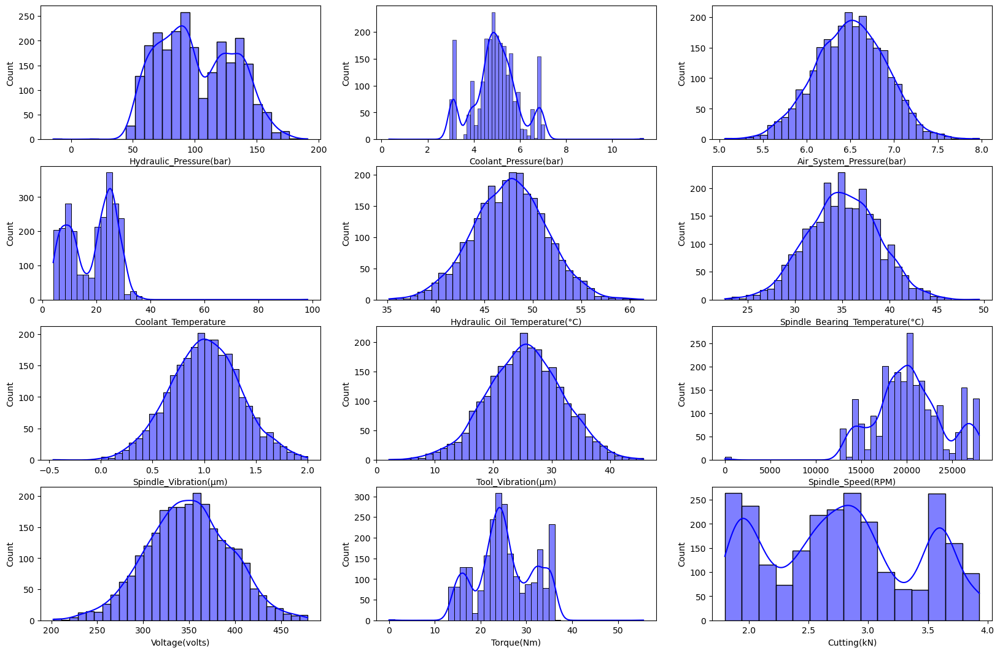

In [44]:
plt.figure(figsize=(20,30))
for i in range(len(num.columns)):
  plt.subplot(9, 3, i+1)
  sns.histplot(x = num.columns[i], data = df, kde = True, color = 'blue')
  plt.xlabel(num.columns[i])
plt.show()

In [45]:
pip install feature_engine

Note: you may need to restart the kernel to use updated packages.


In [46]:
from feature_engine.outliers import Winsorizer
for i in num:
  wins = Winsorizer(capping_method = 'iqr', fold = 1.5, tail = 'both')
  df[i] = wins.fit_transform(pd.DataFrame(df[i]))

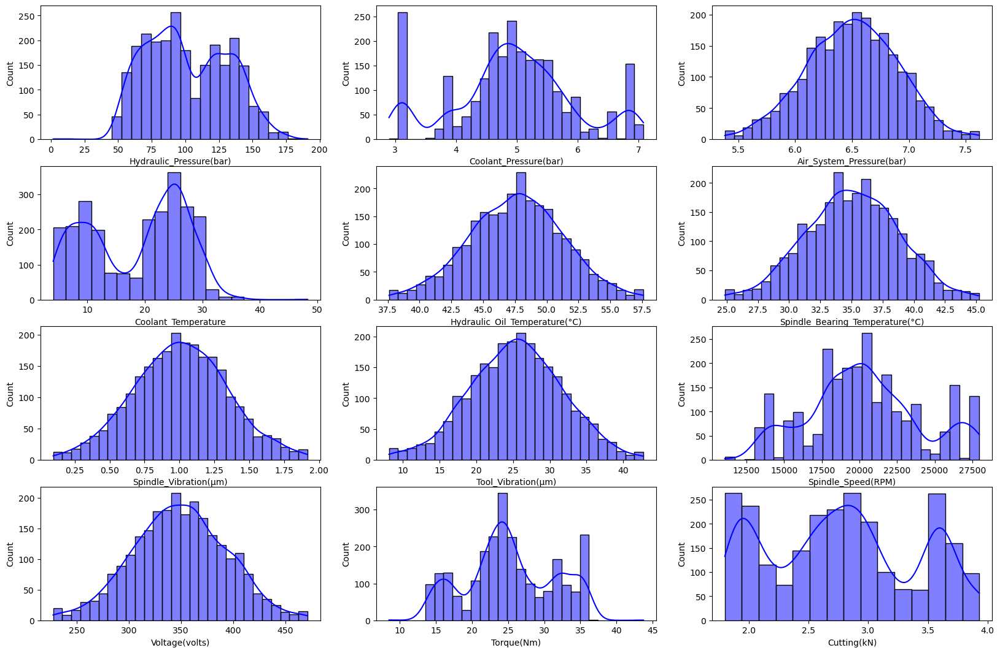

In [47]:
plt.figure(figsize=(20,30))
for i in range(len(num.columns)):
  plt.subplot(9, 3, i+1)
  sns.histplot(x = num.columns[i], data = df, kde = True, color = 'blue')
  plt.xlabel(num.columns[i])
plt.show()

In [48]:
num1.isna().sum()

Hydraulic_Pressure(bar)            0
Coolant_Pressure(bar)              0
Air_System_Pressure(bar)           0
Coolant_Temperature                0
Hydraulic_Oil_Temperature(°C)      0
Spindle_Bearing_Temperature(°C)    0
Spindle_Vibration(µm)              0
Tool_Vibration(µm)                 0
Spindle_Speed(RPM)                 0
Voltage(volts)                     0
Torque(Nm)                         0
Cutting(kN)                        0
dtype: int64

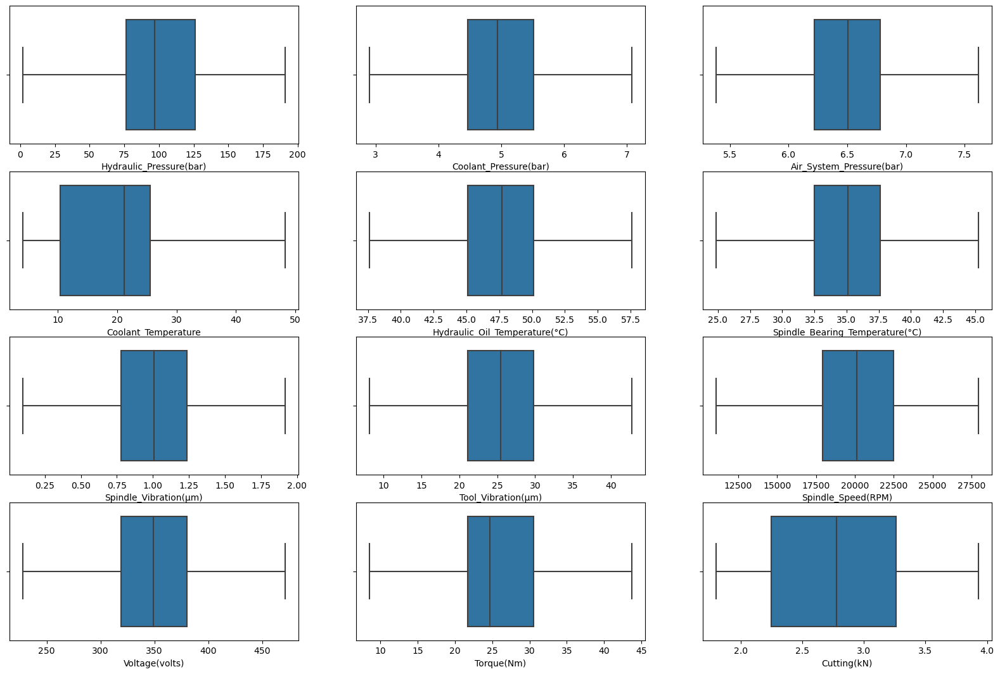

In [49]:
plt.figure(figsize=(20,30))
for i in range(len(num1.columns)):
    plt.subplot(9, 3, i+1)
    sns.boxplot(x = num1.columns[i], data = df)
    plt.xlabel(num1.columns[i])
plt.show()

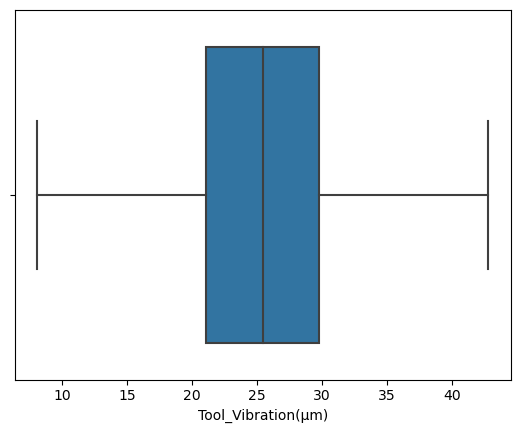

In [50]:
sns.boxplot(x = df['Tool_Vibration(µm)'], data = df)
plt.show()

##### Create new features based on existing features. i create a feature called "Temperature Difference" by subtracting the coolant temperature from the hydraulic oil temperature. This could be a useful feature for identifying machines that are overheating.

In [51]:
df['Temparature_diff'] = df['Hydraulic_Oil_Temperature(°C)'] - df['Coolant_Temperature']

In [52]:
df

,Machine_ID,Assembly_Line_No,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Coolant_Temperature,Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime,Temparature_diff
0,Makino-L1-Unit1-2013,Shopfloor-L1,71.040000,6.933725,6.284965,25.6,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58,1,20.4
1,Makino-L1-Unit1-2013,Shopfloor-L1,125.330000,4.936892,6.196733,35.3,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68,1,12.1
2,Makino-L3-Unit1-2015,Shopfloor-L3,71.120000,6.839413,6.655448,13.1,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55,1,27.6
3,Makino-L2-Unit1-2015,Shopfloor-L2,139.340000,4.574382,6.560394,24.4,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55,1,19.8
4,Makino-L1-Unit1-2013,Shopfloor-L1,60.510000,6.893182,6.141238,4.1,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55,1,43.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,Makino-L1-Unit1-2013,Shopfloor-L1,112.715506,5.220885,6.196610,22.3,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72,0,26.5
2496,Makino-L1-Unit1-2013,Shopfloor-L1,103.086653,5.211886,7.074653,11.9,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94,0,36.4
2497,Makino-L2-Unit1-2015,Shopfloor-L2,118.643165,5.212991,6.530049,4.5,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,2.78,0,45.4
2498,Makino-L3-Unit1-2015,Shopfloor-L3,145.855859,5.207777,6.402655,12.2,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79,0,32.3


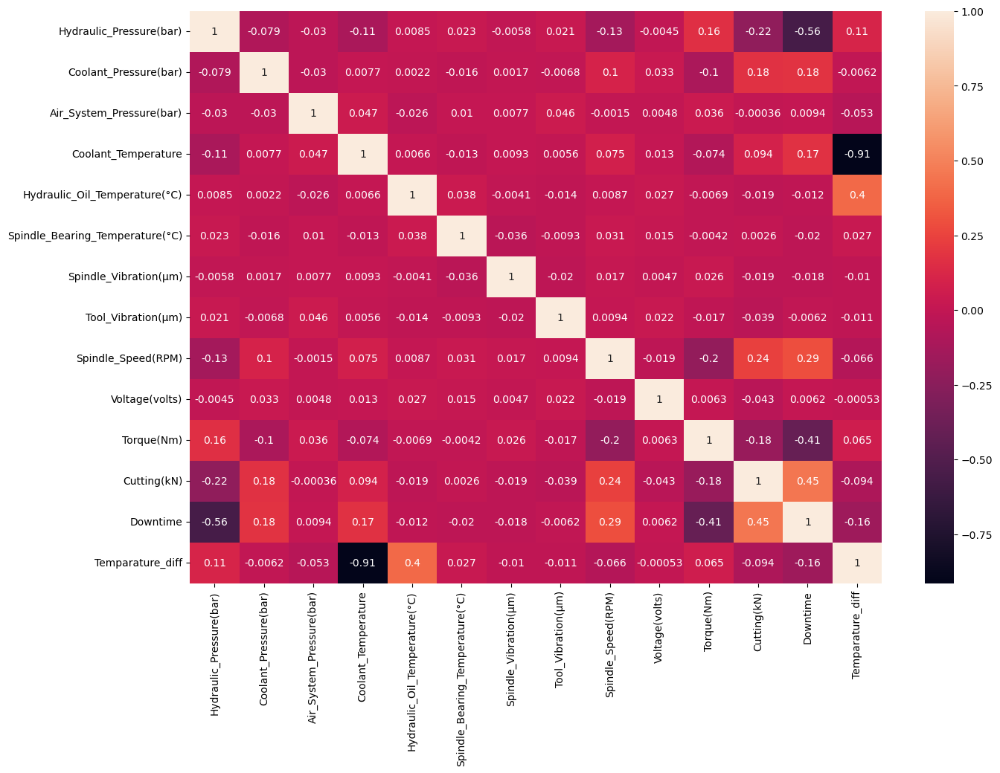

In [53]:
plt.figure(figsize = (15,10))
sns.heatmap(data = df.corr(), annot = True)
plt.show()

In [54]:
df.drop('Coolant_Temperature', axis =1, inplace = True)

In [55]:
df

,Machine_ID,Assembly_Line_No,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime,Temparature_diff
0,Makino-L1-Unit1-2013,Shopfloor-L1,71.040000,6.933725,6.284965,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58,1,20.4
1,Makino-L1-Unit1-2013,Shopfloor-L1,125.330000,4.936892,6.196733,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68,1,12.1
2,Makino-L3-Unit1-2015,Shopfloor-L3,71.120000,6.839413,6.655448,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55,1,27.6
3,Makino-L2-Unit1-2015,Shopfloor-L2,139.340000,4.574382,6.560394,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55,1,19.8
4,Makino-L1-Unit1-2013,Shopfloor-L1,60.510000,6.893182,6.141238,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55,1,43.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,Makino-L1-Unit1-2013,Shopfloor-L1,112.715506,5.220885,6.196610,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72,0,26.5
2496,Makino-L1-Unit1-2013,Shopfloor-L1,103.086653,5.211886,7.074653,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94,0,36.4
2497,Makino-L2-Unit1-2015,Shopfloor-L2,118.643165,5.212991,6.530049,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,2.78,0,45.4
2498,Makino-L3-Unit1-2015,Shopfloor-L3,145.855859,5.207777,6.402655,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79,0,32.3


In [56]:
df.skew()

C:\Users\chakr\AppData\Local\Temp\ipykernel_8180\1665899112.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.skew()


Hydraulic_Pressure(bar)            0.207218
Coolant_Pressure(bar)             -0.013157
Air_System_Pressure(bar)          -0.058196
Hydraulic_Oil_Temperature(°C)     -0.023350
Spindle_Bearing_Temperature(°C)   -0.032694
Spindle_Vibration(µm)              0.025043
Tool_Vibration(µm)                -0.045280
Spindle_Speed(RPM)                 0.194179
Voltage(volts)                    -0.013504
Torque(Nm)                         0.034923
Cutting(kN)                        0.114157
Downtime                          -0.024016
Temparature_diff                   0.161879
dtype: float64

In [57]:
cat1 = cat1.astype('category')

In [58]:
df.dtypes

Machine_ID                          object
Assembly_Line_No                    object
Hydraulic_Pressure(bar)            float64
Coolant_Pressure(bar)              float64
Air_System_Pressure(bar)           float64
Hydraulic_Oil_Temperature(°C)      float64
Spindle_Bearing_Temperature(°C)    float64
Spindle_Vibration(µm)              float64
Tool_Vibration(µm)                 float64
Spindle_Speed(RPM)                 float64
Voltage(volts)                     float64
Torque(Nm)                         float64
Cutting(kN)                        float64
Downtime                             int64
Temparature_diff                   float64
dtype: object

In [59]:
cat1.dtypes

Machine_ID          category
Assembly_Line_No    category
dtype: object

In [60]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse = False, handle_unknown='ignore')

enc = encoder.fit_transform(cat1)
cat1 = pd.DataFrame(enc,columns=encoder.get_feature_names_out())

In [61]:
cat1

,Machine_ID_Makino-L1-Unit1-2013,Machine_ID_Makino-L2-Unit1-2015,Machine_ID_Makino-L3-Unit1-2015,Assembly_Line_No_Shopfloor-L1,Assembly_Line_No_Shopfloor-L2,Assembly_Line_No_Shopfloor-L3
0,1.0,0.0,0.0,1.0,0.0,0.0
1,1.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,1.0
3,0.0,1.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...
2495,1.0,0.0,0.0,1.0,0.0,0.0
2496,1.0,0.0,0.0,1.0,0.0,0.0
2497,0.0,1.0,0.0,0.0,1.0,0.0
2498,0.0,0.0,1.0,0.0,0.0,1.0


In [62]:
data = pd.concat([df, cat1], axis = 1)

In [63]:
data

,Machine_ID,Assembly_Line_No,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),...,Torque(Nm),Cutting(kN),Downtime,Temparature_diff,Machine_ID_Makino-L1-Unit1-2013,Machine_ID_Makino-L2-Unit1-2015,Machine_ID_Makino-L3-Unit1-2015,Assembly_Line_No_Shopfloor-L1,Assembly_Line_No_Shopfloor-L2,Assembly_Line_No_Shopfloor-L3
0,Makino-L1-Unit1-2013,Shopfloor-L1,71.040000,6.933725,6.284965,46.0,33.4,1.291,26.492,25892.0,...,24.055326,3.58,1,20.4,1.0,0.0,0.0,1.0,0.0,0.0
1,Makino-L1-Unit1-2013,Shopfloor-L1,125.330000,4.936892,6.196733,47.4,34.6,1.382,25.274,19856.0,...,14.202890,2.68,1,12.1,1.0,0.0,0.0,1.0,0.0,0.0
2,Makino-L3-Unit1-2015,Shopfloor-L3,71.120000,6.839413,6.655448,40.7,33.0,1.319,30.608,19851.0,...,24.049267,3.55,1,27.6,0.0,0.0,1.0,0.0,0.0,1.0
3,Makino-L2-Unit1-2015,Shopfloor-L2,139.340000,4.574382,6.560394,44.2,40.6,0.618,30.791,18461.0,...,25.860029,3.55,1,19.8,0.0,1.0,0.0,0.0,1.0,0.0
4,Makino-L1-Unit1-2013,Shopfloor-L1,60.510000,6.893182,6.141238,47.3,31.4,0.983,25.516,26526.0,...,25.515874,3.55,1,43.2,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,Makino-L1-Unit1-2013,Shopfloor-L1,112.715506,5.220885,6.196610,48.8,37.2,0.910,20.282,20974.0,...,22.761610,2.72,0,26.5,1.0,0.0,0.0,1.0,0.0,0.0
2496,Makino-L1-Unit1-2013,Shopfloor-L1,103.086653,5.211886,7.074653,48.3,31.5,1.106,34.708,20951.0,...,22.786597,2.94,0,36.4,1.0,0.0,0.0,1.0,0.0,0.0
2497,Makino-L2-Unit1-2015,Shopfloor-L2,118.643165,5.212991,6.530049,49.9,36.2,0.288,16.828,20958.0,...,22.778987,2.78,0,45.4,0.0,1.0,0.0,0.0,1.0,0.0
2498,Makino-L3-Unit1-2015,Shopfloor-L3,145.855859,5.207777,6.402655,44.5,32.1,0.995,26.498,20935.0,...,22.804012,2.79,0,32.3,0.0,0.0,1.0,0.0,0.0,1.0


<AxesSubplot:xlabel='Temparature_diff', ylabel='Count'>

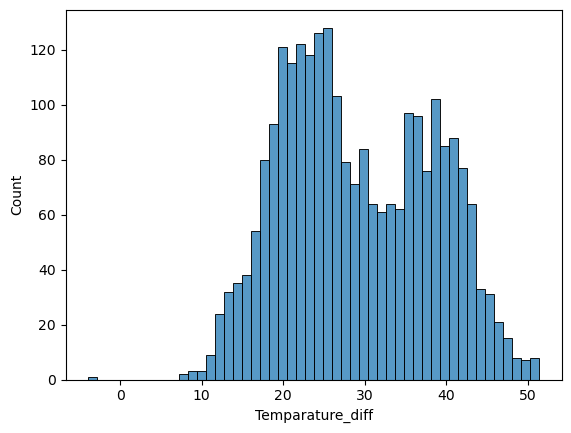

In [64]:
sns.histplot(x = 'Temparature_diff', data = data, bins = 50)

#### Insight

The graph shows the distribution of 'Temparature_diff'. Majority of machine_temparature between 19 to 25.

<AxesSubplot:xlabel='Temparature_diff', ylabel='Count'>

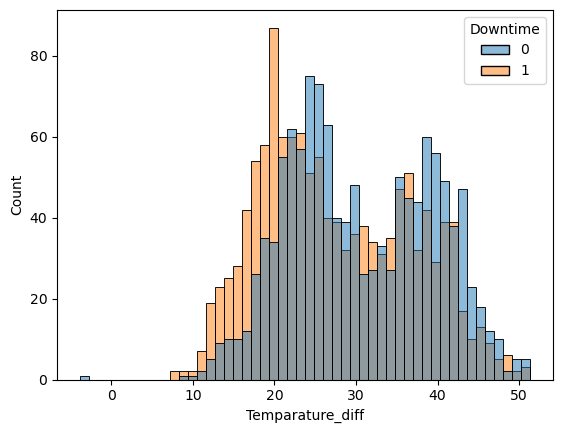

In [65]:
sns.histplot(x = 'Temparature_diff', data = data, bins = 50, hue = 'Downtime')

### Insight

The Majority of machine failure is in Temparature_diff is in 20.

<AxesSubplot:xlabel='Temparature_diff', ylabel='count'>

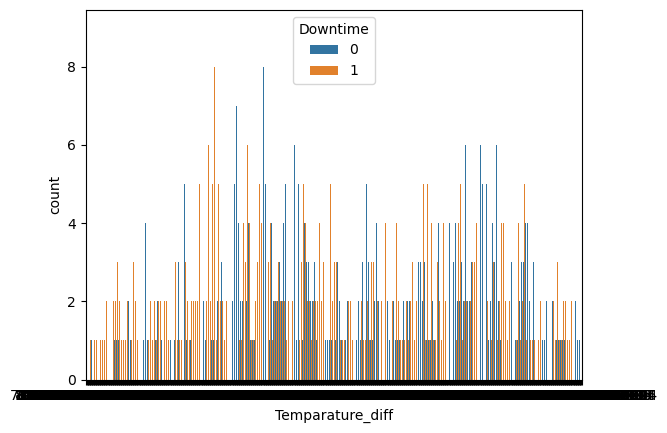

In [66]:
sns.countplot(x = data['Temparature_diff'], hue = data['Downtime'])

In [67]:
data['Temparature_diff'].describe()

count    2500.000000
mean       29.063245
std         9.172699
min        -3.887500
25%        21.700000
50%        27.600000
75%        36.900000
max        51.400000
Name: Temparature_diff, dtype: float64

<AxesSubplot:xlabel='Voltage(volts)', ylabel='Count'>

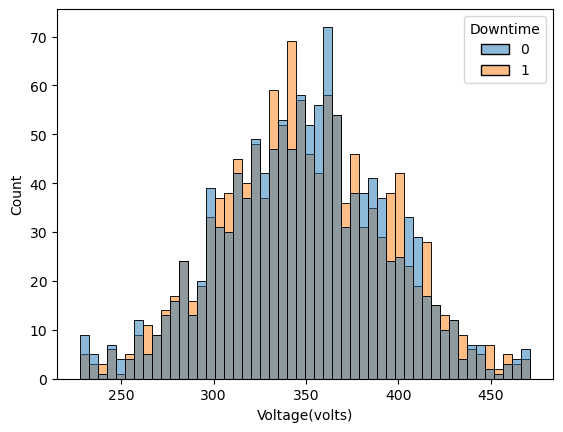

In [68]:
sns.histplot(x = 'Voltage(volts)', data = data, bins = 50, hue = 'Downtime')

In [69]:
data.drop(['Machine_ID', 'Assembly_Line_No'], axis =1, inplace = True)

In [70]:
data

,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Downtime,Temparature_diff,Machine_ID_Makino-L1-Unit1-2013,Machine_ID_Makino-L2-Unit1-2015,Machine_ID_Makino-L3-Unit1-2015,Assembly_Line_No_Shopfloor-L1,Assembly_Line_No_Shopfloor-L2,Assembly_Line_No_Shopfloor-L3
0,71.040000,6.933725,6.284965,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58,1,20.4,1.0,0.0,0.0,1.0,0.0,0.0
1,125.330000,4.936892,6.196733,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68,1,12.1,1.0,0.0,0.0,1.0,0.0,0.0
2,71.120000,6.839413,6.655448,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55,1,27.6,0.0,0.0,1.0,0.0,0.0,1.0
3,139.340000,4.574382,6.560394,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55,1,19.8,0.0,1.0,0.0,0.0,1.0,0.0
4,60.510000,6.893182,6.141238,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55,1,43.2,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,112.715506,5.220885,6.196610,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72,0,26.5,1.0,0.0,0.0,1.0,0.0,0.0
2496,103.086653,5.211886,7.074653,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94,0,36.4,1.0,0.0,0.0,1.0,0.0,0.0
2497,118.643165,5.212991,6.530049,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,2.78,0,45.4,0.0,1.0,0.0,0.0,1.0,0.0
2498,145.855859,5.207777,6.402655,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79,0,32.3,0.0,0.0,1.0,0.0,0.0,1.0


In [71]:
data.dtypes

Hydraulic_Pressure(bar)            float64
Coolant_Pressure(bar)              float64
Air_System_Pressure(bar)           float64
Hydraulic_Oil_Temperature(°C)      float64
Spindle_Bearing_Temperature(°C)    float64
Spindle_Vibration(µm)              float64
Tool_Vibration(µm)                 float64
Spindle_Speed(RPM)                 float64
Voltage(volts)                     float64
Torque(Nm)                         float64
Cutting(kN)                        float64
Downtime                             int64
Temparature_diff                   float64
Machine_ID_Makino-L1-Unit1-2013    float64
Machine_ID_Makino-L2-Unit1-2015    float64
Machine_ID_Makino-L3-Unit1-2015    float64
Assembly_Line_No_Shopfloor-L1      float64
Assembly_Line_No_Shopfloor-L2      float64
Assembly_Line_No_Shopfloor-L3      float64
dtype: object

In [72]:
x = data.drop(['Downtime'], axis = 1)
y = data['Downtime']

In [73]:
x

,Hydraulic_Pressure(bar),Coolant_Pressure(bar),Air_System_Pressure(bar),Hydraulic_Oil_Temperature(°C),Spindle_Bearing_Temperature(°C),Spindle_Vibration(µm),Tool_Vibration(µm),Spindle_Speed(RPM),Voltage(volts),Torque(Nm),Cutting(kN),Temparature_diff,Machine_ID_Makino-L1-Unit1-2013,Machine_ID_Makino-L2-Unit1-2015,Machine_ID_Makino-L3-Unit1-2015,Assembly_Line_No_Shopfloor-L1,Assembly_Line_No_Shopfloor-L2,Assembly_Line_No_Shopfloor-L3
0,71.040000,6.933725,6.284965,46.0,33.4,1.291,26.492,25892.0,335.0,24.055326,3.58,20.4,1.0,0.0,0.0,1.0,0.0,0.0
1,125.330000,4.936892,6.196733,47.4,34.6,1.382,25.274,19856.0,368.0,14.202890,2.68,12.1,1.0,0.0,0.0,1.0,0.0,0.0
2,71.120000,6.839413,6.655448,40.7,33.0,1.319,30.608,19851.0,325.0,24.049267,3.55,27.6,0.0,0.0,1.0,0.0,0.0,1.0
3,139.340000,4.574382,6.560394,44.2,40.6,0.618,30.791,18461.0,360.0,25.860029,3.55,19.8,0.0,1.0,0.0,0.0,1.0,0.0
4,60.510000,6.893182,6.141238,47.3,31.4,0.983,25.516,26526.0,354.0,25.515874,3.55,43.2,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,112.715506,5.220885,6.196610,48.8,37.2,0.910,20.282,20974.0,282.0,22.761610,2.72,26.5,1.0,0.0,0.0,1.0,0.0,0.0
2496,103.086653,5.211886,7.074653,48.3,31.5,1.106,34.708,20951.0,319.0,22.786597,2.94,36.4,1.0,0.0,0.0,1.0,0.0,0.0
2497,118.643165,5.212991,6.530049,49.9,36.2,0.288,16.828,20958.0,335.0,22.778987,2.78,45.4,0.0,1.0,0.0,0.0,1.0,0.0
2498,145.855859,5.207777,6.402655,44.5,32.1,0.995,26.498,20935.0,376.0,22.804012,2.79,32.3,0.0,0.0,1.0,0.0,0.0,1.0


In [74]:
y

0       1
1       1
2       1
3       1
4       1
       ..
2495    0
2496    0
2497    0
2498    0
2499    1
Name: Downtime, Length: 2500, dtype: int64

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
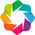

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (2500, 16)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    16 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
No scatter plots with depVar when no depVar is given.
Saving pair_scatters in HTML format
Saving distplots_nums in HTML format                                                                                   
Savi

ModuleNotFoundError: No module named 'dtale'

In [75]:
# Load the Data
import pandas as pd

df1 = pd.read_csv('Machine Downtime.csv')

# Auto EDA
# ---------
# Sweetviz
# Autoviz
# Dtale
# Pandas Profiling
# Dataprep


# Sweetviz
###########
!pip install sweetviz
import sweetviz as sv

s = sv.analyze(df1)
s.show_html()


# Autoviz
###########
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class

av = AutoViz_Class()
a = av.AutoViz('Machine Downtime.csv', chart_format = 'html')

import os
os.getcwd()

# If the dependent variable is known:
a = av.AutoViz('Machine Downtime.csv', depVar = 'Dotime') # depVar - target variable in your dataset



# D-Tale
########

# pip install dtale   # In case of any error then please install werkzeug appropriate version (pip install werkzeug==2.0.3)
import dtale

d = dtale.show(df1)
d.open_browser()


# Pandas Profiling
###################

# pip install pandas_profiling
from pandas_profiling import ProfileReport 

p = ProfileReport(df1)
p
p.to_file("output.html")

import os
os.getcwd()

# Dataprep
##########

# pip install dataprep
from dataprep.eda import create_report

report = create_report(df1, title = 'My Report')

report.show_browser()